# Separated Vertically Stacked Double Quantum Dot from PHIDL

This notebook builds a **vertical / face-to-face double quantum dot with a central separator barrier** from PHIDL primitives, translates the 2D gate design into the existing 3D process-stack representation, writes a nextnano++ input file, optionally runs it, and then inspects the generated outputs.

The geometry is intentionally built as two single-dot modules:

- `P1` is the bottom module plunger, facing upward.
- `P2` is the top module plunger, facing downward as the 180 degree partner.
- Each module keeps its own left/right barrier and ohmic contacts, with unique voltage labels.
- The ohmics are shortened to the plunger body plus head height, leaving a central gap.
- `B_SEP` is a horizontal barrier gate centered in that gap and extending from the left boundary to the right edge of the plunger heads.

## 0. Setup

### 0.1 Imports

In [1]:
from pathlib import Path
import importlib
import json
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

REPO_ROOT = next(
    path for path in [Path.cwd(), *Path.cwd().parents]
    if (path / "src").exists() and (path / "notebooks").exists()
)
if str(REPO_ROOT / "src") not in sys.path:
    sys.path.insert(0, str(REPO_ROOT / "src"))
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from phidl import quickplot as qp

from qd_design import (
    SeparatedVerticallyStackedDoubleDotDevice,
    make_reference_sige_ge_process_stack,
    build_simulation_layout,
    write_nextnano_input_from_template,
)

from src import nextnanopp_tools as nnt
nnt = importlib.reload(nnt)

plt.rcParams["figure.dpi"] = 120
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", 80)

print("REPO_ROOT:", REPO_ROOT)

REPO_ROOT: /Users/robertjovanov/code/qpu-design-automation-toolkit


### 0.2 Helper Functions

In [2]:
def print_json(data):
    print(json.dumps(data, indent=2))


def print_header(title: str):
    print("\n" + "=" * 80)
    print(title)
    print("=" * 80)


def list_tree(path: Path, max_depth: int = 2):
    path = Path(path)
    if not path.exists():
        print(f"Path does not exist: {path}")
        return

    base_depth = len(path.resolve().parts)
    for p in sorted(path.rglob("*")):
        depth = len(p.resolve().parts) - base_depth
        if depth <= max_depth:
            indent = "  " * max(depth - 1, 0)
            marker = "/" if p.is_dir() else ""
            print(f"{indent}{p.name}{marker}")


def layout_spec_table(layout_spec):
    return pd.DataFrame(
        [
            {
                "name": element["name"],
                "gate_type": element["gate_type"],
                "layer_name": element["layer_name"],
                "voltage_label": element["voltage_label"],
                "x_min_nm": element["x_min_nm"],
                "x_max_nm": element["x_max_nm"],
                "y_min_nm": element["y_min_nm"],
                "y_max_nm": element["y_max_nm"],
                "num_polygons": len(element.get("polygon_xy_nm", [])),
            }
            for element in layout_spec
        ]
    )


def plot_layout_polygons(layout_spec, ax=None):
    if ax is None:
        _, ax = plt.subplots(figsize=(7.0, 8.0))

    colors = {
        "plunger": "#D62728",
        "barrier": "#1F77B4",
        "ohmic": "#2CA02C",
        "sensor": "#9467BD",
        "screening": "#8C564B",
    }

    for element in layout_spec:
        color = colors.get(element["gate_type"], "0.45")
        for polygon in element.get("polygon_xy_nm", []):
            points = np.asarray(polygon, dtype=float)
            patch = plt.Polygon(
                points,
                closed=True,
                facecolor=color,
                edgecolor="black",
                linewidth=1.0,
                alpha=0.35,
            )
            ax.add_patch(patch)
        ax.text(
            element["center_x_nm"],
            element["center_y_nm"],
            element["name"],
            ha="center",
            va="center",
            fontsize=8,
            weight="bold",
        )

    x_min = min(element["x_min_nm"] for element in layout_spec)
    x_max = max(element["x_max_nm"] for element in layout_spec)
    y_min = min(element["y_min_nm"] for element in layout_spec)
    y_max = max(element["y_max_nm"] for element in layout_spec)
    pad = 25.0
    ax.set_xlim(x_min - pad, x_max + pad)
    ax.set_ylim(y_min - pad, y_max + pad)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("x (nm)")
    ax.set_ylabel("y (nm)")
    ax.grid(alpha=0.18)
    return ax

### 0.3 Paths and Run Controls

In [14]:
OUTPUT_DIR = REPO_ROOT / "data" / "gds"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

GENERATED_INPUT_DIR = REPO_ROOT / "configs" / "robert_inputs" / "generated"
GENERATED_INPUT_DIR.mkdir(parents=True, exist_ok=True)

TEMPLATE_INPUT_PATH = REPO_ROOT / "configs" / "robert_inputs" / "double_qd" / "3d" / "Double_Quantum_Dot_3D.in"

GDS_PATH = OUTPUT_DIR / "separated_vertically_stacked_double_dot_from_phidl.gds"
SVG_PATH = OUTPUT_DIR / "separated_vertically_stacked_double_dot_from_phidl.svg"
LAYOUT_SPEC_PATH = OUTPUT_DIR / "separated_vertically_stacked_double_dot_from_phidl_layout_spec.json"
SIMULATION_LAYOUT_PATH = OUTPUT_DIR / "separated_vertically_stacked_double_dot_from_phidl_simulation_layout.json"
GENERATED_INPUT_PATH = GENERATED_INPUT_DIR / "Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL.in"

RUNS_DIR = REPO_ROOT / "runs"
RUN_TAG = "separated_structure_only_no_strain_no_poisson"
RUN_SIMULATION = False
BIAS_INDEX = 0

# Fast default for geometry/material/contact verification.
# Set RUN_VARIABLE_OVERRIDES = None and use a new RUN_TAG for the full strain/Poisson solve.
RUN_VARIABLE_OVERRIDES = {
    "strain": 0,
    "poisson": 0,
    "quantum": 0,
    "quantum_poisson": 0,
}

print("Template exists:", TEMPLATE_INPUT_PATH.exists())
print("Template path:", TEMPLATE_INPUT_PATH)
print("Generated input path:", GENERATED_INPUT_PATH)
print("RUN_SIMULATION:", RUN_SIMULATION)

Template exists: True
Template path: /Users/robertjovanov/code/qpu-design-automation-toolkit/configs/robert_inputs/double_qd/3d/Double_Quantum_Dot_3D.in
Generated input path: /Users/robertjovanov/code/qpu-design-automation-toolkit/configs/robert_inputs/generated/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL.in
RUN_SIMULATION: False


The default execution path is a structure-only geometry check: strain, Poisson, quantum, and quantum-Poisson are disabled through `RUN_VARIABLE_OVERRIDES`. Set `RUN_VARIABLE_OVERRIDES = None` and choose a fresh `RUN_TAG` for a full physics run.


## 1. Build the Separated Vertical Double Dot Layout

### 1.1 Instantiate the Parametric Builder

In [4]:
separated_vertical_dot = SeparatedVerticallyStackedDoubleDotDevice(
    name="separated_vertically_stacked_double_dot_from_phidl",

    device_y_size_nm=200.0,
    module_gap_nm=0.0,

    ohmic_width_nm=40.0,
    ohmic_length_nm=None,  # defaults to plunger body plus head height

    separator_barrier_name="B_SEP",
    separator_barrier_voltage_label="V_B_SEP",

    barrier_width_nm=40.0,
    barrier_length_nm=140.0,

    plunger_body_width_nm=40.0,
    plunger_body_length_nm=50.0,
    plunger_head_top_width_nm=60.0,
    plunger_head_max_width_nm=100.0,
    plunger_head_height_nm=100.0,
    plunger_upper_taper_height_nm=25.0,
    plunger_lower_taper_height_nm=25.0,

    ohmic_to_barrier_gap_nm=20.0,
    barrier_to_plunger_gap_nm=20.0,
)

layout = separated_vertical_dot.ensure_built()

print_header("Separated Vertical Double Dot Device Summary")
print_json(separated_vertical_dot.summary())
print("Layout bbox:", layout.bbox)


Separated Vertical Double Dot Device Summary
{
  "name": "separated_vertically_stacked_double_dot_from_phidl",
  "device_y_size_nm": 200.0,
  "module_gap_nm": 0.0,
  "module_pitch_y_nm": 200.0,
  "facing_plunger_gap_nm": 100.0,
  "ohmic_width_nm": 40.0,
  "ohmic_length_nm": 150.0,
  "barrier_width_nm": 40.0,
  "barrier_length_nm": 140.0,
  "separator_barrier_name": "B_SEP",
  "separator_barrier_voltage_label": "V_B_SEP",
  "separator_start_x_nm": -170.0,
  "separator_end_x_nm": 50.0,
  "separator_length_nm": 220.0,
  "separator_center_y_nm": 200.0,
  "separator_y_min_nm": 180.0,
  "plunger_body_width_nm": 40.0,
  "plunger_body_length_nm": 50.0,
  "plunger_head_top_width_nm": 60.0,
  "plunger_head_max_width_nm": 100.0,
  "plunger_head_height_nm": 100.0,
  "plunger_upper_taper_height_nm": 25.0,
  "plunger_lower_taper_height_nm": 25.0,
  "ohmic_to_barrier_gap_nm": 20.0,
  "barrier_to_plunger_gap_nm": 20.0
}
Layout bbox: [[-170.    0.]
 [ 170.  400.]]


### 1.2 Visualize the Layout

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


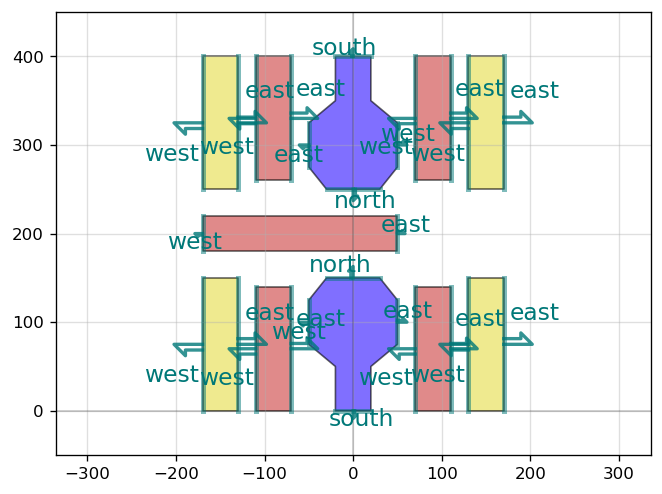

In [5]:
qp(layout)

### 1.3 Matplotlib Footprint Check

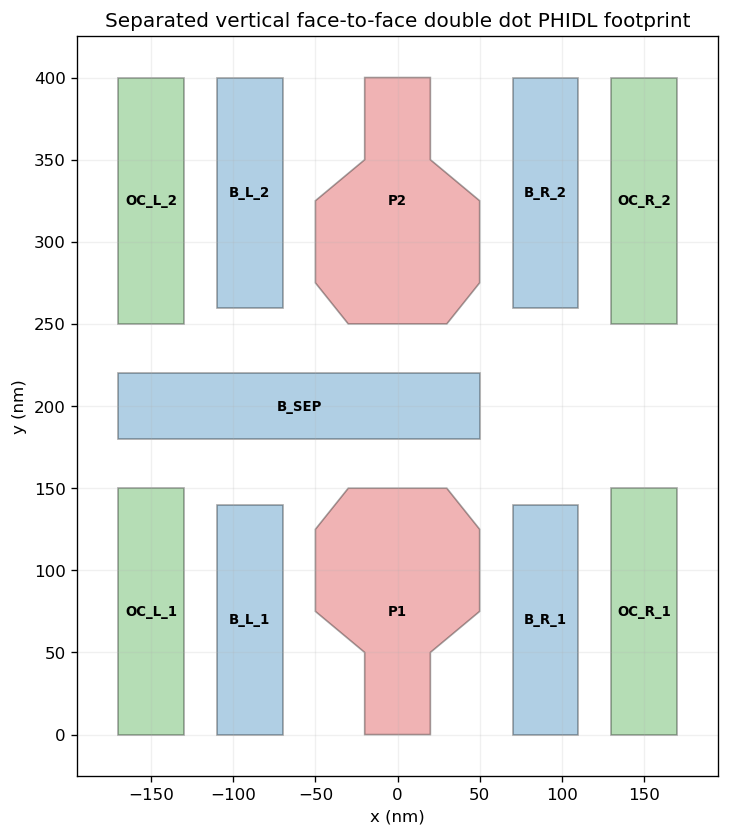

,name,gate_type,layer_name,voltage_label,x_min_nm,x_max_nm,y_min_nm,y_max_nm,num_polygons
0,OC_L_1,ohmic,ohmic,V_OC_L_1,-170.0,-130.0,0.0,150.0,1
1,B_L_1,barrier,barrier,V_B_L_1,-110.0,-70.0,0.0,140.0,1
2,P1,plunger,plunger,V_P1,-50.0,50.0,0.0,150.0,1
3,B_R_1,barrier,barrier,V_B_R_1,70.0,110.0,0.0,140.0,1
4,OC_R_1,ohmic,ohmic,V_OC_R_1,130.0,170.0,0.0,150.0,1
5,OC_L_2,ohmic,ohmic,V_OC_L_2,-170.0,-130.0,250.0,400.0,1
6,B_L_2,barrier,barrier,V_B_L_2,-110.0,-70.0,260.0,400.0,1
7,P2,plunger,plunger,V_P2,-50.0,50.0,250.0,400.0,1
8,B_R_2,barrier,barrier,V_B_R_2,70.0,110.0,260.0,400.0,1
9,OC_R_2,ohmic,ohmic,V_OC_R_2,130.0,170.0,250.0,400.0,1


In [6]:
layout_spec = separated_vertical_dot.layout_spec()
ax = plot_layout_polygons(layout_spec)
ax.set_title("Separated vertical face-to-face double dot PHIDL footprint")
plt.show()

display(layout_spec_table(layout_spec))

### 1.4 Export GDS, SVG, and Layout Spec

In [7]:
separated_vertical_dot.write_gds(str(GDS_PATH))
separated_vertical_dot.write_svg(str(SVG_PATH))

with open(LAYOUT_SPEC_PATH, "w", encoding="utf-8") as f:
    json.dump(layout_spec, f, indent=2)

print("Saved GDS:", GDS_PATH)
print("Saved SVG:", SVG_PATH)
print("Saved layout spec:", LAYOUT_SPEC_PATH)

Saved GDS: /Users/robertjovanov/code/qpu-design-automation-toolkit/data/gds/separated_vertically_stacked_double_dot_from_phidl.gds
Saved SVG: /Users/robertjovanov/code/qpu-design-automation-toolkit/data/gds/separated_vertically_stacked_double_dot_from_phidl.svg
Saved layout spec: /Users/robertjovanov/code/qpu-design-automation-toolkit/data/gds/separated_vertically_stacked_double_dot_from_phidl_layout_spec.json


## 2. Build the 3D Simulation Layout

### 2.1 Reference Process Stack

In [8]:
process_stack = make_reference_sige_ge_process_stack()

print_header("Process Stack")
print_json(process_stack.to_dict())


Process Stack
{
  "name": "SiGe_Ge_QW_two_metal_gate_layers",
  "z_reference_name": "top_of_Ge_QW",
  "z_min_nm": -4015.0,
  "z_max_nm": 173.0,
  "material_layers": [
    {
      "name": "SiGe_buffer",
      "material": "SiGe",
      "z_min_nm": -4015.0,
      "z_max_nm": -15.0,
      "alloy_x": 0.15,
      "notes": null
    },
    {
      "name": "Ge_QW",
      "material": "Ge",
      "z_min_nm": -15.0,
      "z_max_nm": 0.0,
      "alloy_x": null,
      "notes": null
    },
    {
      "name": "SiGe_cap",
      "material": "SiGe",
      "z_min_nm": 0.0,
      "z_max_nm": 101.0,
      "alloy_x": 0.15,
      "notes": null
    },
    {
      "name": "Al2O3_dielectric",
      "material": "Al2O3",
      "z_min_nm": 101.0,
      "z_max_nm": 173.0,
      "alloy_x": null,
      "notes": null
    }
  ],
  "gate_rules": [
    {
      "name": "barrier_gate_rule",
      "applies_to_layer_names": [
        "barrier"
      ],
      "material": "Al",
      "z_min_nm": 108.0,
      "z_max_nm": 138.

### 2.2 Combine Layout Spec and Process Stack

In [9]:
simulation_layout = build_simulation_layout(
    name="separated_vertically_stacked_double_dot_simulation_layout",
    layout_elements=layout_spec,
    process_stack=process_stack,
    x_margin_nm=0.0,
    y_margin_nm=0.0,
)

simulation_layout.write_json(str(SIMULATION_LAYOUT_PATH))

print_header("Simulation Layout Domain")
print_json(simulation_layout.domain.to_dict())
print("Saved simulation layout:", SIMULATION_LAYOUT_PATH)


Simulation Layout Domain
{
  "x_min_nm": -170.0,
  "x_max_nm": 170.0,
  "y_min_nm": 0.0,
  "y_max_nm": 400.0,
  "z_min_nm": -4015.0,
  "z_max_nm": 173.0
}
Saved simulation layout: /Users/robertjovanov/code/qpu-design-automation-toolkit/data/gds/separated_vertically_stacked_double_dot_from_phidl_simulation_layout.json


### 2.3 Inspect Patterned Regions

In [10]:
patterned_rows = [
    {
        "name": region.name,
        "gate_type": region.gate_type,
        "layer_name": region.layer_name,
        "material": region.material,
        "voltage_label": region.voltage_label,
        "x_min_nm": region.x_min_nm,
        "x_max_nm": region.x_max_nm,
        "y_min_nm": region.y_min_nm,
        "y_max_nm": region.y_max_nm,
        "z_min_nm": region.z_min_nm,
        "z_max_nm": region.z_max_nm,
        "num_polygons": len(region.polygon_xy_nm),
    }
    for region in simulation_layout.patterned_regions
]
display(pd.DataFrame(patterned_rows))

,name,gate_type,layer_name,material,voltage_label,x_min_nm,x_max_nm,y_min_nm,y_max_nm,z_min_nm,z_max_nm,num_polygons
0,OC_L_1,ohmic,ohmic,Al,V_OC_L_1,-170.0,-130.0,0.0,150.0,-77.0,173.0,1
1,B_L_1,barrier,barrier,Al,V_B_L_1,-110.0,-70.0,0.0,140.0,108.0,138.0,1
2,P1,plunger,plunger,Al,V_P1,-50.0,50.0,0.0,150.0,143.0,173.0,1
3,B_R_1,barrier,barrier,Al,V_B_R_1,70.0,110.0,0.0,140.0,108.0,138.0,1
4,OC_R_1,ohmic,ohmic,Al,V_OC_R_1,130.0,170.0,0.0,150.0,-77.0,173.0,1
5,OC_L_2,ohmic,ohmic,Al,V_OC_L_2,-170.0,-130.0,250.0,400.0,-77.0,173.0,1
6,B_L_2,barrier,barrier,Al,V_B_L_2,-110.0,-70.0,260.0,400.0,108.0,138.0,1
7,P2,plunger,plunger,Al,V_P2,-50.0,50.0,250.0,400.0,143.0,173.0,1
8,B_R_2,barrier,barrier,Al,V_B_R_2,70.0,110.0,260.0,400.0,108.0,138.0,1
9,OC_R_2,ohmic,ohmic,Al,V_OC_R_2,130.0,170.0,250.0,400.0,-77.0,173.0,1


## 3. Write the nextnano++ Input

### 3.1 Generate the `.in` File from the 3D Template

In [11]:
if not TEMPLATE_INPUT_PATH.exists():
    raise FileNotFoundError(
        f"Template input file not found: {TEMPLATE_INPUT_PATH}\n"
        "Update TEMPLATE_INPUT_PATH before generating the nextnano input."
    )

voltage_overrides = {
    "V_P1": -3.0,
    "V_P2": -3.0,
    "V_B_L_1": 0.0,
    "V_B_R_1": 0.0,
    "V_B_L_2": 0.0,
    "V_B_R_2": 0.0,
    "V_OC_L_1": 0.0,
    "V_OC_R_1": 0.0,
    "V_OC_L_2": 0.0,
    "V_OC_R_2": 0.0,
    "V_B_SEP": 0.0,
}

write_nextnano_input_from_template(
    simulation_layout=simulation_layout,
    template_path=TEMPLATE_INPUT_PATH,
    output_path=GENERATED_INPUT_PATH,
    voltage_overrides=voltage_overrides,
)

print("Generated nextnano input file:", GENERATED_INPUT_PATH)

Generated nextnano input file: /Users/robertjovanov/code/qpu-design-automation-toolkit/configs/robert_inputs/generated/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL.in


### 3.2 Input Sanity Checks

In [12]:
text = GENERATED_INPUT_PATH.read_text(encoding="utf-8")

checks = pd.Series(
    {
        "polygonal_prism count": text.count("polygonal_prism"),
        "patterned region count": len(simulation_layout.patterned_regions),
        "schottky contact count": text.count("schottky{"),
        "has P1 contact": 'name = "P1"' in text,
        "has P2 contact": 'name = "P2"' in text,
        "has B_SEP contact": 'name = "B_SEP"' in text,
        "has quantum run switch": "!WHEN $quantum            quantum{}" in text,
        "top-level quantum blocks": text.count("\nquantum{"),
    }
)
display(checks.to_frame("value"))

print_header("First 90 Lines of Generated Input")
for i, line in enumerate(text.splitlines()[:90], start=1):
    print(f"{i:04d}: {line}")

,value
polygonal_prism count,11
patterned region count,11
schottky contact count,11
has P1 contact,True
has P2 contact,True
has B_SEP contact,True
has quantum run switch,True
top-level quantum blocks,1



First 90 Lines of Generated Input
0001: #--------------------------------------
0002: #--- generated gate voltage values ---
0003: #--------------------------------------
0004: $V_OC_L_1         = 0 # (V) generated
0005: $V_B_L_1          = 0 # (V) generated
0006: $V_P1             = -3 # (V) generated
0007: $V_B_R_1          = 0 # (V) generated
0008: $V_OC_R_1         = 0 # (V) generated
0009: $V_OC_L_2         = 0 # (V) generated
0010: $V_B_L_2          = 0 # (V) generated
0011: $V_P2             = -3 # (V) generated
0012: $V_B_R_2          = 0 # (V) generated
0013: $V_OC_R_2         = 0 # (V) generated
0014: $V_B_SEP          = 0 # (V) generated
0015: 
0016: # Double Quantum Dot - 3D - Robert Jovanov
0017: 
0018: #----------------------
0019: #--- solver control ---
0020: #----------------------
0021: 
0022: #--- choice of solvers ---
0023: 
0024: $strain  = 1
0025: $poisson = 1
0026: $quantum = 0
0027: $quantum_poisson =  0
0028: 
0029: $decomposition = 0            # use decompos

## 4. Run the nextnano Simulation

### 4.1 Execute the Generated Input

Set `RUN_SIMULATION = True` in the config cell, or override it here, to launch nextnano++. By default this notebook uses `RUN_VARIABLE_OVERRIDES` to disable strain/Poisson/quantum for a fast structure-output check. Set `RUN_VARIABLE_OVERRIDES = None` and choose a new `RUN_TAG` when you want the full strain/Poisson solve. The helper stages the generated input under a unique timestamped filename so previous runs are not overwritten.

In [15]:
if RUN_SIMULATION:
    RUNS_DIR.mkdir(parents=True, exist_ok=True)

    input_file = nnt.run_input_file(
        GENERATED_INPUT_PATH,
        output_root=RUNS_DIR,
        tag=RUN_TAG,
        add_timestamp=True,
        variables=RUN_VARIABLE_OVERRIDES,
        show_log=True,
        convergenceCheck=False,
        staging_root=GENERATED_INPUT_DIR / "staged_runs",
        keep_staged_input=True,
    )

    OUTPUT_RUN_DIR = nnt.get_output_directory(input_file)
    print("Simulation launched/completed.")
    print("Output run directory:", OUTPUT_RUN_DIR)
else:
    OUTPUT_RUN_DIR = None
    print("RUN_SIMULATION is False. Set it to True and rerun this cell to execute nextnano.")
    print("Run tag that will be used:", RUN_TAG)

RUN_SIMULATION is False. Set it to True and rerun this cell to execute nextnano.
Run tag that will be used: separated_structure_only_no_strain_no_poisson


### 4.2 Resolve a Completed Run

In [16]:
RUNS_DIR.mkdir(parents=True, exist_ok=True)

if OUTPUT_RUN_DIR is None:
    matching_runs = nnt.find_runs_for_input(RUNS_DIR, GENERATED_INPUT_PATH)
    tagged_runs = [run for run in matching_runs if RUN_TAG in run.name]
    if tagged_runs:
        matching_runs = tagged_runs
    OUTPUT_RUN_DIR = matching_runs[-1] if matching_runs else None

RUN_AVAILABLE = OUTPUT_RUN_DIR is not None and Path(OUTPUT_RUN_DIR).exists()

if RUN_AVAILABLE:
    OUTPUT_RUN_DIR = nnt.resolve_run_root(OUTPUT_RUN_DIR)
    RUN_PATHS = nnt.get_run_paths(OUTPUT_RUN_DIR)
    BIAS0 = nnt.get_bias_dir(OUTPUT_RUN_DIR, bias=BIAS_INDEX)
    HAS_QUANTUM_OUTPUTS = (BIAS0 / "Quantum").exists() and any((BIAS0 / "Quantum").rglob("*.dat"))

    run_summary = pd.Series(
        {
            "RUN_ROOT": str(OUTPUT_RUN_DIR),
            "RUN_NAME": OUTPUT_RUN_DIR.name,
            "BIAS_FOLDER": str(BIAS0),
            "job_done": (OUTPUT_RUN_DIR / "job_done.txt").exists(),
            "HAS_QUANTUM_OUTPUTS": HAS_QUANTUM_OUTPUTS,
            "N_STRUCTURE_FILES": len(list(RUN_PATHS.structure.glob("*"))) if RUN_PATHS.structure.exists() else 0,
            "N_VTR_FILES_IN_BIAS": len(list(BIAS0.glob("*.vtr"))),
            "N_FLD_FILES_IN_BIAS": len(list(BIAS0.glob("*.fld"))),
            "N_DAT_FILES_IN_BIAS": len(list(BIAS0.glob("*.dat"))),
        }
    )
    display(run_summary.to_frame("value"))
else:
    print(f"No completed run for {GENERATED_INPUT_PATH.stem!r} was found under {RUNS_DIR}.")
    print("Run section 4.1 before using the output-inspection cells below.")

,value
RUN_ROOT,/Users/robertjovanov/code/qpu-design-automatio...
RUN_NAME,Separated_Vertically_Stacked_Double_Quantum_Do...
BIAS_FOLDER,/Users/robertjovanov/code/qpu-design-automatio...
job_done,True
HAS_QUANTUM_OUTPUTS,False
N_STRUCTURE_FILES,20
N_VTR_FILES_IN_BIAS,8
N_FLD_FILES_IN_BIAS,22
N_DAT_FILES_IN_BIAS,0


## 5. Inspect Generated Structure and Outputs

This section starts with structural checks from nextnano's `Structure` folder before moving on to electrostatic and carrier-density quantities. The main goals are to verify the simulated material stack, region-index output, shortened ohmics, and the central separator-barrier geometry.

### 5.1 Locate the Structure Outputs

By default this points at the completed separated vertical-stack run matching `GENERATED_INPUT_PATH` and `RUN_TAG`. If you rerun with a different output folder, update `OUTPUT_RUN_DIR` below.

In [27]:
OUTPUT_RUN_DIR = "/Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum"

In [28]:
# Set this manually after a run if needed.
default_run_name = (
    GENERATED_INPUT_PATH.stem
    if "GENERATED_INPUT_PATH" in globals()
    else "Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL"
)
RUNS_DIR = Path(globals().get("RUNS_DIR", Path("../../runs"))).resolve()

if "OUTPUT_RUN_DIR" not in globals() or OUTPUT_RUN_DIR is None:
    OUTPUT_RUN_DIR = RUNS_DIR / default_run_name
else:
    OUTPUT_RUN_DIR = Path(OUTPUT_RUN_DIR).resolve()

STRUCTURE_DIR = OUTPUT_RUN_DIR / "Structure"

print("Output run directory:", OUTPUT_RUN_DIR.resolve())
print("Run exists:", OUTPUT_RUN_DIR.exists())
print("Structure folder exists:", STRUCTURE_DIR.exists())

if not STRUCTURE_DIR.exists():
    raise FileNotFoundError(
        f"Structure folder not found: {STRUCTURE_DIR.resolve()}\n"
        "Run the nextnano simulation first, or set OUTPUT_RUN_DIR to the completed run folder."
    )

print_header("Structure Folder")
list_tree(STRUCTURE_DIR, max_depth=1)


Output run directory: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum
Run exists: True
Structure folder exists: True

Structure Folder
contact_indices.txt
contacts.vtr
contacts_2d_xy_QW.fld
contacts_2d_xz_QW.fld
density_acceptor.vtr
density_acceptor_2d_xy_QW.fld
density_acceptor_2d_xz_QW.fld
density_fixed_charge.vtr
density_fixed_charge_2d_xy_QW.fld
density_fixed_charge_2d_xz_QW.fld
material_indices.txt
materials.vtr
materials_2d_xy_QW.fld
materials_2d_xz_QW.fld
regions_all.vtr
regions_all_2d_xy_QW.fld
regions_all_2d_xz_QW.fld
regions_material.vtr
regions_material_2d_xy_QW.fld
regions_material_2d_xz_QW.fld


### 5.2 Lightweight Readers for nextnano Structure Files

The 3D structure outputs are ASCII VTK rectilinear grids (`.vtr`). The helper below parses those directly, so this inspection section does not require PyVista/VTK. The 2D quick-look plots use the AVS field (`.fld`) slices that nextnano also writes.

In [29]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    import plotly.graph_objects as go
except ImportError:
    go = None
    print(
        "Plotly is needed for the rotatable 3D view. "
        "Install it with `conda install plotly` or `pip install plotly`."
    )

VTR_DATA_ARRAY_RE = re.compile(
    r'<DataArray[^>]*Name\s*=\s*"([^"]+)"[^>]*>(.*?)</DataArray>',
    flags=re.DOTALL,
)
COORDINATE_ARRAY_NAMES = ("X_COORDINATES", "Y_COORDINATES", "Z_COORDINATES")


def read_index_lookup(path: Path) -> pd.DataFrame:
    """Read nextnano `*_indices.txt` lookup tables."""
    path = Path(path)
    if not path.exists():
        return pd.DataFrame(columns=["Index"])
    lookup = pd.read_csv(path, sep=r"\s+")
    lookup["Index"] = lookup["Index"].astype(int)
    return lookup


def read_ascii_vtr_index(path: Path, dtype=np.int32) -> dict:
    """Read a nextnano ASCII `.vtr` rectilinear-grid index output.

    Returns a dictionary with `x`, `y`, `z`, and `values`, where `values` has
    shape `(n_z, n_y, n_x)` and is addressed as `values[z, y, x]`.
    """
    path = Path(path)
    if not path.exists():
        raise FileNotFoundError(path)

    text = path.read_text(encoding="utf-8")
    arrays = {}
    for name, body in VTR_DATA_ARRAY_RE.findall(text):
        clean_name = name.strip()
        arr_dtype = np.float64 if clean_name in COORDINATE_ARRAY_NAMES else np.float32
        arrays[clean_name] = np.fromstring(body, sep=" ", dtype=arr_dtype)

    missing = [name for name in COORDINATE_ARRAY_NAMES if name not in arrays]
    if missing:
        raise ValueError(f"Missing coordinate arrays in {path.name}: {missing}")

    data_names = [name for name in arrays if name not in COORDINATE_ARRAY_NAMES]
    if len(data_names) != 1:
        raise ValueError(f"Expected exactly one data array in {path.name}, got {data_names}")

    x, y, z = (arrays[name] for name in COORDINATE_ARRAY_NAMES)
    raw = arrays[data_names[0]]
    expected = len(x) * len(y) * len(z)
    if raw.size != expected:
        raise ValueError(
            f"{path.name}: expected {expected:,} values from grid dimensions, got {raw.size:,}"
        )

    values = np.rint(raw).astype(dtype, copy=False).reshape((len(z), len(y), len(x)))
    return {"path": path, "label": data_names[0], "x": x, "y": y, "z": z, "values": values}


def read_avs_fld(path: Path, dtype=np.int32) -> dict:
    """Read a 2D nextnano AVS/Express `.fld` rectilinear slice."""
    path = Path(path)
    lines = path.read_text(encoding="utf-8").splitlines()
    header = "\n".join(lines[:40])

    def header_int(pattern: str) -> int:
        match = re.search(pattern, header)
        if match is None:
            raise ValueError(f"Could not parse `{pattern}` in {path.name}")
        return int(match.group(1))

    dim1 = header_int(r"dim1\s*=\s*(\d+)")
    dim2 = header_int(r"dim2\s*=\s*(\d+)")
    variable_skip = header_int(r"variable\s+1[^\n]*skip=(\d+)")
    coord1_skip = header_int(r"coord\s+1[^\n]*skip=(\d+)")
    coord2_skip = header_int(r"coord\s+2[^\n]*skip=(\d+)")
    label_match = re.search(r"label\s*=\s*([^\n]+)", header)
    label = label_match.group(1).strip() if label_match else path.stem

    coord1 = np.fromstring("\n".join(lines[coord1_skip:coord1_skip + dim1]), sep=" ", dtype=np.float64)
    coord2 = np.fromstring("\n".join(lines[coord2_skip:coord2_skip + dim2]), sep=" ", dtype=np.float64)
    raw = np.fromstring("\n".join(lines[variable_skip:]), sep=" ", dtype=np.float32)

    expected = dim1 * dim2
    if raw.size < expected:
        raise ValueError(f"{path.name}: expected {expected:,} values, got {raw.size:,}")

    values = np.rint(raw[:expected]).astype(dtype, copy=False).reshape((dim2, dim1))
    return {"path": path, "label": label, "coord1": coord1, "coord2": coord2, "values": values}


def summarize_index_grid(grid: dict, lookup=None, name_column=None) -> pd.DataFrame:
    values = grid["values"]
    unique, counts = np.unique(values, return_counts=True)
    summary = pd.DataFrame(
        {
            "Index": unique.astype(int),
            "grid_points": counts.astype(int),
            "fraction": counts / counts.sum(),
        }
    )

    if lookup is not None and not lookup.empty and name_column in lookup.columns:
        names = lookup.set_index("Index")[name_column].to_dict()
        summary.insert(1, name_column, summary["Index"].map(names).fillna(""))

    return summary


def centers_to_edges(centers: np.ndarray) -> np.ndarray:
    centers = np.asarray(centers, dtype=float)
    if centers.size == 1:
        return np.array([centers[0] - 0.5, centers[0] + 0.5])

    edges = np.empty(centers.size + 1, dtype=float)
    edges[1:-1] = 0.5 * (centers[:-1] + centers[1:])
    edges[0] = centers[0] - 0.5 * (centers[1] - centers[0])
    edges[-1] = centers[-1] + 0.5 * (centers[-1] - centers[-2])
    return edges


def contiguous_runs(indices: np.ndarray) -> list[tuple[int, int]]:
    indices = np.asarray(indices, dtype=int)
    if indices.size == 0:
        return []

    break_positions = np.flatnonzero(np.diff(indices) > 1)
    starts = np.r_[indices[0], indices[break_positions + 1]]
    ends = np.r_[indices[break_positions], indices[-1]]
    return [(int(start), int(end)) for start, end in zip(starts, ends)]


def index_z_intervals(grid: dict, lookup=None, name_column=None) -> pd.DataFrame:
    values = grid["values"]
    z_edges = centers_to_edges(grid["z"])
    rows = []

    for index in sorted(np.unique(values).astype(int)):
        z_profile = np.any(values == index, axis=(1, 2))
        for start, end in contiguous_runs(np.flatnonzero(z_profile)):
            rows.append(
                {
                    "Index": index,
                    "z_min_nm": z_edges[start],
                    "z_max_nm": z_edges[end + 1],
                    "z_grid_points": end - start + 1,
                }
            )

    intervals = pd.DataFrame(rows)
    if lookup is not None and not lookup.empty and name_column in lookup.columns:
        names = lookup.set_index("Index")[name_column].to_dict()
        intervals.insert(1, name_column, intervals["Index"].map(names).fillna(""))

    return intervals


def lookup_index_name(lookup, index: int, name_column) -> str:
    if lookup is None or lookup.empty or name_column not in lookup.columns:
        return f"index {index}"

    matches = lookup.loc[lookup["Index"] == int(index), name_column]
    if matches.empty:
        return f"index {index}"
    return str(matches.iloc[0])

### 5.3 Index Tables and Volume Summaries

These tables answer the first sanity questions: which material/contact indices exist, which grid fraction each occupies, and where each material/contact appears along the growth direction.

In [30]:
material_lookup = read_index_lookup(STRUCTURE_DIR / "material_indices.txt")
contact_lookup = read_index_lookup(STRUCTURE_DIR / "contact_indices.txt")
region_lookup = read_index_lookup(STRUCTURE_DIR / "region_indices.txt")

print_header("Material Index Lookup")
display(material_lookup)

print_header("Contact Index Lookup")
display(contact_lookup)

if region_lookup.empty:
    print("No region_indices.txt file was written in this Structure folder; region outputs are summarized by raw integer index below.")
else:
    print_header("Region Index Lookup")
    display(region_lookup)

print_header("Loading 3D Material and Contact Volumes")
material_grid = read_ascii_vtr_index(STRUCTURE_DIR / "materials.vtr", dtype=np.int16)
contact_grid = read_ascii_vtr_index(STRUCTURE_DIR / "contacts.vtr", dtype=np.int16)
print(
    f"Loaded grid shape (z, y, x): {material_grid['values'].shape}; "
    f"x={len(material_grid['x'])}, y={len(material_grid['y'])}, z={len(material_grid['z'])}"
)

print_header("Material Index Summary")
display(summarize_index_grid(material_grid, material_lookup, "Material"))

print_header("Material z Intervals")
display(index_z_intervals(material_grid, material_lookup, "Material"))

print_header("Contact Index Summary")
display(summarize_index_grid(contact_grid, contact_lookup, "Contact"))

print_header("Contact z Intervals")
display(index_z_intervals(contact_grid, contact_lookup, "Contact"))

print_header("Region Index Summary: regions_all.vtr")
regions_all_summary = summarize_index_grid(
    read_ascii_vtr_index(STRUCTURE_DIR / "regions_all.vtr", dtype=np.int32),
    region_lookup,
    "Region",
)
display(regions_all_summary)

print_header("Region Index Summary: regions_material.vtr")
regions_material_summary = summarize_index_grid(
    read_ascii_vtr_index(STRUCTURE_DIR / "regions_material.vtr", dtype=np.int32),
    region_lookup,
    "Region",
)
display(regions_material_summary)


Material Index Lookup


,Index,Material
0,-1,no_material_defined
1,7,Ge
2,15,Si(x)Ge(1-x)
3,395,Sapphire_zb



Contact Index Lookup


,Index,Contact
0,0,no_contact_defined
1,1,OC_L_1
2,2,B_L_1
3,3,P1
4,4,B_R_1
5,5,OC_R_1
6,6,OC_L_2
7,7,B_L_2
8,8,P2
9,9,B_R_2


No region_indices.txt file was written in this Structure folder; region outputs are summarized by raw integer index below.

Loading 3D Material and Contact Volumes
Loaded grid shape (z, y, x): (2096, 80, 68); x=68, y=80, z=2096

Material Index Summary


,Index,Material,grid_points,fraction
0,7,Ge,43520,0.003817
1,15,Si(x)Ge(1-x),11157440,0.978531
2,395,Sapphire_zb,201280,0.017653



Material z Intervals


,Index,Material,z_min_nm,z_max_nm,z_grid_points
0,7,Ge,-15.031250,0.026348,8
1,15,Si(x)Ge(1-x),-4015.000000,-15.031250,2000
2,15,Si(x)Ge(1-x),0.026348,100.942402,51
3,395,Sapphire_zb,100.942402,173.000000,37



Contact Index Summary


,Index,Contact,grid_points,fraction
0,0,no_contact_defined,11197500,0.982044
1,1,OC_L_1,30480,0.002673
2,2,B_L_1,3360,0.000295
3,3,P1,6450,0.000566
4,4,B_R_1,3360,0.000295
5,5,OC_R_1,30480,0.002673
6,6,OC_L_2,30480,0.002673
7,7,B_L_2,3360,0.000295
8,8,P2,6450,0.000566
9,9,B_R_2,3360,0.000295



Contact z Intervals


,Index,Contact,z_min_nm,z_max_nm,z_grid_points
0,0,no_contact_defined,-4011.000000,-15.031250,1998
1,0,no_contact_defined,0.026348,99.019608,50
2,0,no_contact_defined,100.942402,173.000000,37
3,1,OC_L_1,-77.000000,173.000000,127
4,2,B_L_1,108.062500,137.916664,15
5,3,P1,143.083336,173.000000,15
6,4,B_R_1,108.062500,137.916664,15
7,5,OC_R_1,-77.000000,173.000000,127
8,6,OC_L_2,-77.000000,173.000000,127
9,7,B_L_2,108.062500,137.916664,15



Region Index Summary: regions_all.vtr


,Index,grid_points,fraction
0,0,10839360,0.950634
1,2,224000,0.019645
2,3,134140,0.011764
3,4,10880,0.000954
4,5,4480,0.000393
5,6,35840,0.003143
6,7,30480,0.002673
7,8,3360,0.000295
8,9,6450,0.000566
9,10,3360,0.000295



Region Index Summary: regions_material.vtr


,Index,grid_points,fraction
0,0,10880000,0.954198
1,1,43520,0.003817
2,2,277440,0.024332
3,3,201280,0.017653


### 5.4 Rotatable 3D Device Geometry

This Plotly view shows translucent material slabs plus sampled points from each patterned gate/contact. Drag the plot to rotate. The default `z_range_nm` focuses on the active gate stack so the gates are visible; set it to `None` in the cell below to show the full simulation depth.

In [31]:
MATERIAL_COLORS = {
    -1: "#d9d9d9",  # no_material_defined
    8: "#4daf4a",   # Ge
    16: "#377eb8",  # SiGe
    396: "#bdbdbd", # Sapphire_zb / Al2O3
}
CONTACT_COLOR_SEQUENCE = [
    "#e41a1c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00",
    "#a65628", "#f781bf", "#999999", "#66c2a5", "#fc8d62",
]


def add_box_mesh(fig, x_range, y_range, z_range, name, color, opacity=0.18):
    x0, x1 = x_range
    y0, y1 = y_range
    z0, z1 = z_range
    vertices = np.array(
        [
            [x0, y0, z0], [x1, y0, z0], [x1, y1, z0], [x0, y1, z0],
            [x0, y0, z1], [x1, y0, z1], [x1, y1, z1], [x0, y1, z1],
        ]
    )
    faces = np.array(
        [
            [0, 1, 2], [0, 2, 3],
            [4, 6, 5], [4, 7, 6],
            [0, 4, 5], [0, 5, 1],
            [1, 5, 6], [1, 6, 2],
            [2, 6, 7], [2, 7, 3],
            [3, 7, 4], [3, 4, 0],
        ]
    )
    fig.add_trace(
        go.Mesh3d(
            x=vertices[:, 0],
            y=vertices[:, 1],
            z=vertices[:, 2],
            i=faces[:, 0],
            j=faces[:, 1],
            k=faces[:, 2],
            name=name,
            color=color,
            opacity=opacity,
            hovertemplate=f"{name}<extra></extra>",
            showscale=False,
        )
    )


def sample_contact_points(contact_grid, contact_index, z_range_nm=None, max_points=3000):
    values = contact_grid["values"]
    mask = values == int(contact_index)
    if z_range_nm is not None:
        z_min, z_max = z_range_nm
        z_mask = (contact_grid["z"] >= z_min) & (contact_grid["z"] <= z_max)
        mask = mask & z_mask[:, None, None]

    zz, yy, xx = np.nonzero(mask)
    if xx.size == 0:
        return None

    if max_points is not None and xx.size > max_points:
        selection = np.linspace(0, xx.size - 1, max_points, dtype=int)
        zz, yy, xx = zz[selection], yy[selection], xx[selection]

    return contact_grid["x"][xx], contact_grid["y"][yy], contact_grid["z"][zz]


def plot_structure_3d(
    material_grid,
    contact_grid,
    material_lookup=None,
    contact_lookup=None,
    contact_ids=None,
    z_range_nm=(-120, 180),
    max_points_per_contact=3000,
):
    if go is None:
        raise ImportError("Plotly is required for the rotatable 3D structure view.")

    fig = go.Figure()
    x_edges = centers_to_edges(material_grid["x"])
    y_edges = centers_to_edges(material_grid["y"])
    material_intervals = index_z_intervals(material_grid, material_lookup, "Material")

    for _, row in material_intervals.iterrows():
        z0, z1 = float(row["z_min_nm"]), float(row["z_max_nm"])
        if z_range_nm is not None:
            view_z0, view_z1 = z_range_nm
            if z1 < view_z0 or z0 > view_z1:
                continue
            z0, z1 = max(z0, view_z0), min(z1, view_z1)

        index = int(row["Index"])
        material_name = lookup_index_name(material_lookup, index, "Material")
        add_box_mesh(
            fig,
            (x_edges[0], x_edges[-1]),
            (y_edges[0], y_edges[-1]),
            (z0, z1),
            name=f"material {index}: {material_name}",
            color=MATERIAL_COLORS.get(index, "#cccccc"),
            opacity=0.16,
        )

    if contact_ids is None:
        contact_ids = [int(i) for i in sorted(np.unique(contact_grid["values"])) if int(i) != 0]

    for color_i, contact_index in enumerate(contact_ids):
        sampled = sample_contact_points(
            contact_grid,
            contact_index,
            z_range_nm=z_range_nm,
            max_points=max_points_per_contact,
        )
        if sampled is None:
            continue

        xs, ys, zs = sampled
        contact_name = lookup_index_name(contact_lookup, contact_index, "Contact")
        color = CONTACT_COLOR_SEQUENCE[color_i % len(CONTACT_COLOR_SEQUENCE)]
        fig.add_trace(
            go.Scatter3d(
                x=xs,
                y=ys,
                z=zs,
                mode="markers",
                name=f"contact {contact_index}: {contact_name}",
                marker={"size": 2.5, "color": color, "opacity": 0.85},
                hovertemplate=(
                    f"contact {contact_index}: {contact_name}<br>"
                    "x=%{x:.1f} nm<br>y=%{y:.1f} nm<br>z=%{z:.1f} nm<extra></extra>"
                ),
            )
        )

    title = "Simulated 3D device structure"
    if z_range_nm is not None:
        title += f" (z = {z_range_nm[0]} to {z_range_nm[1]} nm)"

    fig.update_layout(
        title=title,
        height=760,
        margin={"l": 0, "r": 0, "t": 48, "b": 0},
        legend={"itemsizing": "constant"},
        scene={
            "xaxis_title": "x (nm)",
            "yaxis_title": "y (nm)",
            "zaxis_title": "z (nm)",
            "aspectmode": "manual",
            "aspectratio": {"x": 0.9, "y": 1.45, "z": 0.8},
            "camera": {"eye": {"x": 1.5, "y": -1.7, "z": 1.0}},
        },
    )
    return fig


surface_gate_names = [
    "OC_L_1", "B_L_1", "P1", "B_R_1", "OC_R_1", "B_SEP",
    "OC_L_2", "B_L_2", "P2", "B_R_2", "OC_R_2",
]
contact_name_to_index = dict(zip(contact_lookup["Contact"], contact_lookup["Index"]))
surface_gate_ids = [contact_name_to_index[name] for name in surface_gate_names if name in contact_name_to_index]

structure_fig = plot_structure_3d(
    material_grid,
    contact_grid,
    material_lookup=material_lookup,
    contact_lookup=contact_lookup,
    contact_ids=surface_gate_ids,
    z_range_nm=(-120, 180),
    max_points_per_contact=3500,
)
structure_fig.show()

# To include auxiliary contacts as well, use:
# all_contact_ids = [int(i) for i in contact_lookup["Index"] if int(i) != 0]
# plot_structure_3d(material_grid, contact_grid, material_lookup, contact_lookup, all_contact_ids).show()

# To show the full z depth instead of the active stack, set z_range_nm=None:
# plot_structure_3d(material_grid, contact_grid, material_lookup, contact_lookup, surface_gate_ids, z_range_nm=None).show()

### 5.5 2D Structural Slices

These are quick-look slices through the QW plane. They are useful for checking that the material/contact/region-index outputs agree in the expected `xy` and `xz` cuts.

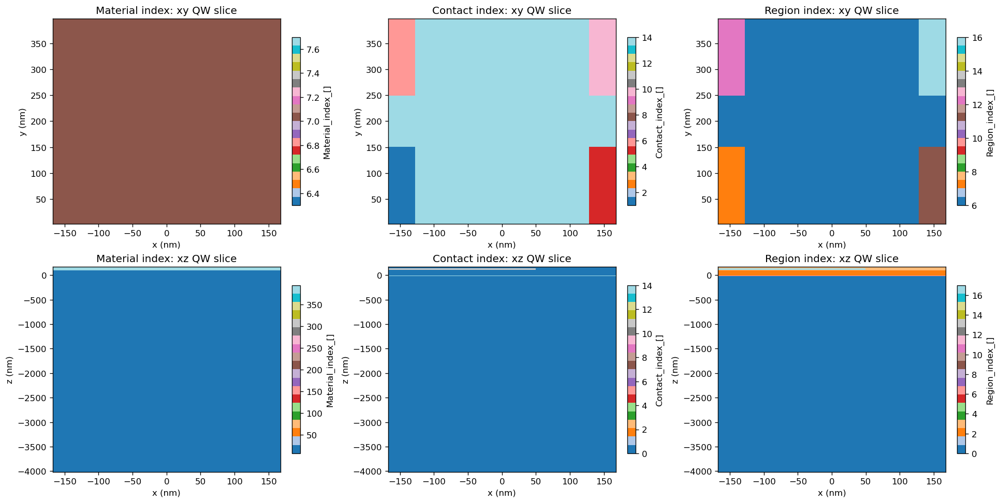

In [32]:
def infer_slice_axes(path: Path):
    stem = Path(path).stem
    if "_xy_" in stem:
        return "x", "y"
    if "_xz_" in stem:
        return "x", "z"
    if "_yz_" in stem:
        return "y", "z"
    return "coord1", "coord2"


def plot_fld_index_slice(path: Path, ax=None, title=None, cmap="tab20"):
    data = read_avs_fld(path)
    axis1, axis2 = infer_slice_axes(path)

    if ax is None:
        _, ax = plt.subplots(figsize=(6, 4))

    image = ax.imshow(
        data["values"],
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        extent=[data["coord1"].min(), data["coord1"].max(), data["coord2"].min(), data["coord2"].max()],
        cmap=cmap,
    )
    ax.set_title(title or path.name)
    ax.set_xlabel(f"{axis1} (nm)")
    ax.set_ylabel(f"{axis2} (nm)")
    plt.colorbar(image, ax=ax, shrink=0.82, label=data["label"])
    return ax


slice_specs = [
    (STRUCTURE_DIR / "materials_2d_xy_QW.fld", "Material index: xy QW slice"),
    (STRUCTURE_DIR / "contacts_2d_xy_QW.fld", "Contact index: xy QW slice"),
    (STRUCTURE_DIR / "regions_all_2d_xy_QW.fld", "Region index: xy QW slice"),
    (STRUCTURE_DIR / "materials_2d_xz_QW.fld", "Material index: xz QW slice"),
    (STRUCTURE_DIR / "contacts_2d_xz_QW.fld", "Contact index: xz QW slice"),
    (STRUCTURE_DIR / "regions_all_2d_xz_QW.fld", "Region index: xz QW slice"),
]

fig, axes = plt.subplots(2, 3, figsize=(16, 8), constrained_layout=True)
for ax, (path, title) in zip(axes.ravel(), slice_specs):
    plot_fld_index_slice(path, ax=ax, title=title)
plt.show()

## 6. Inspect Physical Outputs

### 6.1 Hole Density Volume and Slices

Start with `density_hole.vtr`, the full 3D hole-density output in `bias_00000`. The first plot is a downsampled 3D Plotly volume focused around the quantum well. The second plot extracts an exact 2D plane from the same VTR file. Change `slice_axis` and `slice_value` to inspect arbitrary cuts.

In [33]:
import importlib
import nextnanopp_tools as nnt

# During notebook development, reload the local helper module so newly added
# functions are visible without restarting the kernel.
nnt = importlib.reload(nnt)

list_variables = nnt.list_variables
plot_bias_volume_3d = nnt.plot_bias_volume_3d
plot_bias_volume_slice = nnt.plot_bias_volume_slice
plot_vtr_linecut = nnt.plot_vtr_linecut
resolve_bias_output_file = nnt.resolve_bias_output_file

RUNS_DIR = Path(globals().get("RUNS_DIR", Path("../../runs"))).resolve()

if "OUTPUT_RUN_DIR" not in globals() or OUTPUT_RUN_DIR is None or not Path(OUTPUT_RUN_DIR).exists():
    matching_runs = [
        p for p in RUNS_DIR.iterdir()
        if p.is_dir() and GENERATED_INPUT_PATH.stem in p.name
    ]
    if "RUN_TAG" in globals():
        tagged_runs = [p for p in matching_runs if RUN_TAG in p.name]
        if tagged_runs:
            matching_runs = tagged_runs
    if not matching_runs:
        raise FileNotFoundError(f"No matching runs found under {RUNS_DIR}")
    OUTPUT_RUN_DIR = max(matching_runs, key=lambda p: p.stat().st_mtime)
else:
    OUTPUT_RUN_DIR = Path(OUTPUT_RUN_DIR).resolve()

BIAS_INDEX = 0

# DEFAULT_1D_LINE_DIAGNOSTIC: edit these two values to move every default 1D line cut.
# The default follows the separated vertical-dot axis through the plunger centers at z = -2 nm.
DEFAULT_1D_LINE_AXIS = "y"
DEFAULT_1D_LINE_FIXED_COORDS = {"x": 0.0, "z": -2.0}

DENSITY_HOLE_VTR = resolve_bias_output_file(
    OUTPUT_RUN_DIR,
    "density_hole",
    bias=BIAS_INDEX,
    preferred_extensions=("vtr",),
)

print("Physics run directory:", OUTPUT_RUN_DIR.resolve())
print("Hole-density VTR:", DENSITY_HOLE_VTR.resolve())
print("Variables:", list_variables(DENSITY_HOLE_VTR))


Physics run directory: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum
Hole-density VTR: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum/bias_00000/density_hole.vtr
Variables: ['Hole_density']


#### 6.1.0 Default 1D Line-Cut Diagnostics <!-- DEFAULT_1D_LINE_DIAGNOSTIC -->

The default diagnostic follows the separated stacked-dot direction (`y`) while fixing `x = 0 nm` through the plunger centers and `z = -2 nm` in the quantum-well region. Change `DEFAULT_1D_LINE_AXIS` or `DEFAULT_1D_LINE_FIXED_COORDS` in the setup cell above to reuse the same diagnostic cells for another trace.


In [34]:
# DEFAULT_1D_LINE_DIAGNOSTIC

def _format_fixed_coords_for_title(fixed_coords):
    return ", ".join(f"{name}={value:g} nm" for name, value in fixed_coords.items())


def plot_default_1d_diagnostic(
    quantity,
    variable,
    *,
    axis=None,
    fixed_coords=None,
    bias=None,
    yscale="linear",
    title=None,
):
    """Plot one editable 1D VTR diagnostic using the shared notebook defaults."""
    axis = DEFAULT_1D_LINE_AXIS if axis is None else axis
    fixed_coords = dict(DEFAULT_1D_LINE_FIXED_COORDS if fixed_coords is None else fixed_coords)
    bias = BIAS_INDEX if bias is None else bias
    path = resolve_bias_output_file(
        OUTPUT_RUN_DIR,
        quantity,
        bias=bias,
        preferred_extensions=("vtr",),
    )
    coord_label = _format_fixed_coords_for_title(fixed_coords)
    plot_title = title or f"{variable} along {axis} ({coord_label})"
    fig = plot_vtr_linecut(
        path,
        variable=variable,
        axis=axis,
        fixed_coords=fixed_coords,
        title=plot_title,
        interactive=True,
        yscale=yscale,
    )
    print(f"{quantity}/{variable}: {axis}-line with requested fixed coordinates {fixed_coords}")
    return fig


In [35]:
# 3D overview of the hole density. The z range focuses on the quantum-well region;
# use coord_ranges=None to render a heavily downsampled view of the full simulated z domain.
hole_density_volume_fig = plot_bias_volume_3d(
    OUTPUT_RUN_DIR,
    "density_hole",
    bias=BIAS_INDEX,
    variable="Hole_density",
    title="Hole density near the quantum well",
    log10=False,
    coord_ranges={"z": (-30.0, 170.0)},
    max_points=150_000,
    mode="volume",       # use "isosurface" for sharper density contours
    opacity=0.18,
    surface_count=10,
)

In [36]:
# Exact 2D plane extracted from density_hole.vtr.
# Fix z near the QW midpoint to get the lateral x-y hole-density profile.
hole_density_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "density_hole",
    bias=BIAS_INDEX,
    variable="Hole_density",
    slice_axis="z",
    slice_value=-2.0,
    interactive=True,
    log10=False,
)

In [37]:
# Other useful cuts through the same 3D VTR volume:

plot_bias_volume_slice(
    OUTPUT_RUN_DIR, "density_hole", bias=BIAS_INDEX, variable="Hole_density",
    slice_axis="x", slice_value=0.0, interactive=True, log10=False,
)

plot_bias_volume_slice(
    OUTPUT_RUN_DIR, "density_hole", bias=BIAS_INDEX, variable="Hole_density",
    slice_axis="y", slice_value=200.0, interactive=True, log10=False,
)

#### 6.1.1 Hole Density 1D Diagnostic <!-- DEFAULT_1D_LINE_DIAGNOSTIC -->

This line cut uses the same VTR volume as the 3D and 2D plots, but samples only the default separated-dot axis trace.


In [38]:
# DEFAULT_1D_LINE_DIAGNOSTIC
hole_density_linecut_fig = plot_default_1d_diagnostic(
    "density_hole",
    "Hole_density",
    title="Hole density along the separated vertical device axis (x=0 nm, z=-2 nm)",
)


density_hole/Hole_density: y-line with requested fixed coordinates {'x': 0.0, 'z': -2.0}


### 6.2 Electron Density Volume and Slices

Same workflow as the hole density, now using `density_electron.vtr`. The QW-plane slice fixes `z = -7.5 nm` to show the lateral electron-density profile.

In [39]:
DENSITY_ELECTRON_VTR = resolve_bias_output_file(
    OUTPUT_RUN_DIR,
    "density_electron",
    bias=BIAS_INDEX,
    preferred_extensions=("vtr",),
)

print("Electron-density VTR:", DENSITY_ELECTRON_VTR.resolve())
print("Variables:", list_variables(DENSITY_ELECTRON_VTR))

Electron-density VTR: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum/bias_00000/density_electron.vtr
Variables: ['Electron_density']


In [40]:
# 3D overview of the electron density near the quantum-well region.
electron_density_volume_fig = plot_bias_volume_3d(
    OUTPUT_RUN_DIR,
    "density_electron",
    bias=BIAS_INDEX,
    variable="Electron_density",
    title="Electron density near the quantum well",
    log10=False,
    coord_ranges={"z": (-30.0, 170.0)},
    max_points=150_000,
    mode="volume",
    opacity=0.18,
    surface_count=10,
)

ValueError: Cannot plot volume with a single finite value: 0.0

In [ ]:
# Exact x-y QW-plane slice extracted from density_electron.vtr.
electron_density_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "density_electron",
    bias=BIAS_INDEX,
    variable="Electron_density",
    slice_axis="z",
    slice_value=-7.5,
    interactive=True,
    log10=False,
)

#### 6.2.1 Electron Density 1D Diagnostic <!-- DEFAULT_1D_LINE_DIAGNOSTIC -->

The same default trace is useful for checking whether the electron density remains negligible or develops a localized feature along the separated stacked dots.


In [ ]:
# DEFAULT_1D_LINE_DIAGNOSTIC
electron_density_linecut_fig = plot_default_1d_diagnostic(
    "density_electron",
    "Electron_density",
    title="Electron density along the separated vertical device axis (x=0 nm, z=-2 nm)",
)


### 6.3 Electrostatic Potential Volume and Slices

Use `potential.vtr` for the same 3D view and exact QW-plane cut. Potential is signed, so this plot uses linear values rather than `log10`.

In [41]:
POTENTIAL_VTR = resolve_bias_output_file(
    OUTPUT_RUN_DIR,
    "potential",
    bias=BIAS_INDEX,
    preferred_extensions=("vtr",),
)

print("Potential VTR:", POTENTIAL_VTR.resolve())
print("Variables:", list_variables(POTENTIAL_VTR))

Potential VTR: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum/bias_00000/potential.vtr
Variables: ['Potential']


In [42]:
# 3D overview of the electrostatic potential near the quantum-well region.
potential_volume_fig = plot_bias_volume_3d(
    OUTPUT_RUN_DIR,
    "potential",
    bias=BIAS_INDEX,
    variable="Potential",
    title="Electrostatic potential near the quantum well",
    log10=False,
    coord_ranges={"z": (-30.0, 10.0)},
    max_points=150_000,
    mode="volume",
    opacity=0.18,
    surface_count=10,
)

In [43]:
# Exact x-y QW-plane slice extracted from potential.vtr.
potential_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "potential",
    bias=BIAS_INDEX,
    variable="Potential",
    # title="Electrostatic potential at the QW plane",
    slice_axis="z",
    slice_value=-2.0,
    interactive=True,
    log10=False,
)

#### 6.3.1 Potential 1D Diagnostic <!-- DEFAULT_1D_LINE_DIAGNOSTIC -->

This scans the electrostatic potential along the separated stacked-dot axis at `x = 0 nm` and `z = -2 nm`.


In [44]:
# DEFAULT_1D_LINE_DIAGNOSTIC
potential_linecut_fig = plot_default_1d_diagnostic(
    "potential",
    "Potential",
    title="Electrostatic potential along the separated vertical device axis (x=0 nm, z=-2 nm)",
)


potential/Potential: y-line with requested fixed coordinates {'x': 0.0, 'z': -2.0}


### 6.4 Band Edges Volume and Slices

`bandedges.vtr` contains multiple variables and is much larger than the density/potential files. The cells below intentionally load one component at a time. Start with the HH band edge because it is usually the most relevant valence-band component for hole confinement, then run other components as needed.

In [45]:
BANDEDGES_VTR = resolve_bias_output_file(
    OUTPUT_RUN_DIR,
    "bandedges",
    bias=BIAS_INDEX,
    preferred_extensions=("vtr",),
)

print("Band-edges VTR:", BANDEDGES_VTR.resolve())
print("Variables:", list_variables(BANDEDGES_VTR))

Band-edges VTR: /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Separated_Vertically_Stacked_Double_Quantum_Dot_3D_from_PHIDL_quantum/bias_00000/bandedges.vtr
Variables: ['Gamma', 'Delta_1', 'Delta_2', 'Delta_3', 'L_1', 'L_2', 'L_3', 'L_4', 'HH', 'LH', 'SO', 'electron_Fermi_level', 'hole_Fermi_level']


In [46]:
# HH band edge: 3D overview near the quantum-well region.
hh_bandedges_volume_fig = plot_bias_volume_3d(
    OUTPUT_RUN_DIR,
    "bandedges",
    bias=BIAS_INDEX,
    variable="HH",
    title="HH band edge near the quantum well",
    log10=False,
    coord_ranges={"z": (-30.0, 10.0)},
    max_points=150_000,
    mode="volume",
    opacity=0.18,
    surface_count=10,
)

In [47]:
# HH band edge: exact x-y QW-plane slice.
hh_bandedges_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "bandedges",
    bias=BIAS_INDEX,
    variable="HH",
    title="HH band edge at the QW plane",
    slice_axis="z",
    slice_value=-7.5,
    interactive=True,
    log10=False,
)

In [48]:
# LH band edge: exact x-y QW-plane slice.
lh_bandedges_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "bandedges",
    bias=BIAS_INDEX,
    variable="LH",
    title="LH band edge at the QW plane",
    slice_axis="z",
    slice_value=-7.5,
    interactive=True,
    log10=False,
)

In [49]:
# SO band edge: exact x-y QW-plane slice.
so_bandedges_qw_slice_fig = plot_bias_volume_slice(
    OUTPUT_RUN_DIR,
    "bandedges",
    bias=BIAS_INDEX,
    variable="SO",
    title="SO band edge at the QW plane",
    slice_axis="z",
    slice_value=-7.5,
    interactive=True,
    log10=False,
)

#### 6.4.1 Band-Edge 1D Diagnostics <!-- DEFAULT_1D_LINE_DIAGNOSTIC -->

Use the same line-cut geometry for the HH, LH, and SO band edges so their relative confinement profiles can be compared along the separated stacked-dot axis.


In [50]:
# DEFAULT_1D_LINE_DIAGNOSTIC
bandedge_linecut_figs = {}
for bandedge_variable in ("HH", "LH", "SO"):
    bandedge_linecut_figs[bandedge_variable] = plot_default_1d_diagnostic(
        "bandedges",
        bandedge_variable,
        title=f"{bandedge_variable} band edge along the separated vertical device axis (x=0 nm, z=-2 nm)",
    )


bandedges/HH: y-line with requested fixed coordinates {'x': 0.0, 'z': -2.0}


bandedges/LH: y-line with requested fixed coordinates {'x': 0.0, 'z': -2.0}


bandedges/SO: y-line with requested fixed coordinates {'x': 0.0, 'z': -2.0}


In [51]:
# Optional electron-relevant band-edge slices. Run these if you want conduction-band checks too.
#
# gamma_bandedges_qw_slice_fig = plot_bias_volume_slice(
#     OUTPUT_RUN_DIR, "bandedges", bias=BIAS_INDEX, variable="Gamma",
#     title="Gamma band edge at the QW plane", slice_axis="z", slice_value=-7.5,
#     interactive=True, log10=False,
# )
#
# delta1_bandedges_qw_slice_fig = plot_bias_volume_slice(
#     OUTPUT_RUN_DIR, "bandedges", bias=BIAS_INDEX, variable="Delta_1",
#     title="Delta_1 band edge at the QW plane", slice_axis="z", slice_value=-7.5,
#     interactive=True, log10=False,
# )
#
# l1_bandedges_qw_slice_fig = plot_bias_volume_slice(
#     OUTPUT_RUN_DIR, "bandedges", bias=BIAS_INDEX, variable="L_1",
#     title="L_1 band edge at the QW plane", slice_axis="z", slice_value=-7.5,
#     interactive=True, log10=False,
# )

In [52]:
# DEFAULT_1D_LINE_DIAGNOSTIC
# Optional conduction-band 1D diagnostics. Uncomment the variables you want to inspect.
#
# for bandedge_variable in ("Gamma", "Delta_1", "L_1"):
#     bandedge_linecut_figs[bandedge_variable] = plot_default_1d_diagnostic(
#         "bandedges",
#         bandedge_variable,
#         title=f"{bandedge_variable} band edge along the separated vertical device axis (x=0 nm, z=-2 nm)",
#     )
